# PyORBIT output.mat comparison
02: Mini simulation scan using measured tomo longitudinal distribution

In [1]:
import os
import glob
import imageio
import pickle
import pandas as pd
import numpy as np
import PyNAFF as pnf
import scipy.io as sio 
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit

In [2]:
plt.rcParams['figure.figsize'] = [9.0, 8.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 8

plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 5

In [3]:
def round_sig(x, sig=3):
        return round(x, sig-int(floor(log10(abs(x))))-1)

def replace_point_with_p(input_str):
        return input_str.replace(".", "p")
    
def is_non_zero_file(fpath):  
        print '\n\t\t\tis_non_zero_file:: Checking file ', fpath
        print '\n\t\t\tis_non_zero_file:: File exists = ', os.path.isfile(fpath)
        print '\n\t\t\tis_non_zero_file:: Size > 3 bytes = ', os.path.getsize(fpath)
        return os.path.isfile(fpath) and os.path.getsize(fpath) > 3

In [4]:
def add_input_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [5]:
def make_directory(path):
    try:
        os.mkdir(path)
    except OSError:
        print ("Creation of the directory %s failed" % path)
    else:
        print ("Successfully created the directory %s " % path)  

In [6]:
dd1 = dict() # NoSC H
dd2 = dict() # SC H
dd3 = dict() # NoSC V
dd4 = dict() # SC V

dd1 = add_input_file(dd1, '0_H_07/output/output.mat', '6.07')
dd1 = add_input_file(dd1, '0_H_08/output/output.mat', '6.08')
dd1 = add_input_file(dd1, '0_H_09/output/output.mat', '6.09')
dd1 = add_input_file(dd1, '0_H_10/output/output.mat', '6.10')
dd1 = add_input_file(dd1, '0_H_11/output/output.mat', '6.11')
dd1 = add_input_file(dd1, '0_H_12/output/output.mat', '6.12')
dd1 = add_input_file(dd1, '0_H_13/output/output.mat', '6.13')
dd1 = add_input_file(dd1, '0_H_14/output/output.mat', '6.14')
dd1 = add_input_file(dd1, '0_H_15/output/output.mat', '6.15')
dd1 = add_input_file(dd1, '0_H_16/output/output.mat', '6.16')
#dd1 = add_input_file(dd1, '0_H_17/output/output.mat', '6.17')
dd1 = add_input_file(dd1, '0_H_18/output/output.mat', '6.18')
#dd1 = add_input_file(dd1, '0_H_19/output/output.mat', '6.19')
dd1 = add_input_file(dd1, '0_H_20/output/output.mat', '6.20')
dd1 = add_input_file(dd1, '0_H_21/output/output.mat', '6.21')

dd2 = add_input_file(dd2, '1_H_07/output/output.mat', '6.07')
dd2 = add_input_file(dd2, '1_H_08/output/output.mat', '6.08')
dd2 = add_input_file(dd2, '1_H_09/output/output.mat', '6.09')
dd2 = add_input_file(dd2, '1_H_10/output/output.mat', '6.10')
dd2 = add_input_file(dd2, '1_H_11/output/output.mat', '6.11')
dd2 = add_input_file(dd2, '1_H_12/output/output.mat', '6.12')
dd2 = add_input_file(dd2, '1_H_13/output/output.mat', '6.13')
dd2 = add_input_file(dd2, '1_H_14/output/output.mat', '6.14')
dd2 = add_input_file(dd2, '1_H_15/output/output.mat', '6.15')
dd2 = add_input_file(dd2, '1_H_16/output/output.mat', '6.16')
dd2 = add_input_file(dd2, '1_H_17/output/output.mat', '6.17')
dd2 = add_input_file(dd2, '1_H_18/output/output.mat', '6.18')
dd2 = add_input_file(dd2, '1_H_19/output/output.mat', '6.19')
dd2 = add_input_file(dd2, '1_H_20/output/output.mat', '6.20')
dd2 = add_input_file(dd2, '1_H_21/output/output.mat', '6.21')

dd3 = add_input_file(dd3, '0_V_10/output/output.mat', '6.10')
dd3 = add_input_file(dd3, '0_V_11/output/output.mat', '6.11')
dd3 = add_input_file(dd3, '0_V_12/output/output.mat', '6.12')
dd3 = add_input_file(dd3, '0_V_13/output/output.mat', '6.13')
dd3 = add_input_file(dd3, '0_V_14/output/output.mat', '6.14')
dd3 = add_input_file(dd3, '0_V_15/output/output.mat', '6.15')
dd3 = add_input_file(dd3, '0_V_16/output/output.mat', '6.16')
dd3 = add_input_file(dd3, '0_V_17/output/output.mat', '6.17')
dd3 = add_input_file(dd3, '0_V_18/output/output.mat', '6.18')
dd3 = add_input_file(dd3, '0_V_19/output/output.mat', '6.19')
dd3 = add_input_file(dd3, '0_V_20/output/output.mat', '6.20')
dd3 = add_input_file(dd3, '0_V_21/output/output.mat', '6.21')
dd3 = add_input_file(dd3, '0_V_22/output/output.mat', '6.22')
dd3 = add_input_file(dd3, '0_V_23/output/output.mat', '6.23')
dd3 = add_input_file(dd3, '0_V_24/output/output.mat', '6.24')

dd4 = add_input_file(dd4, '1_V_10/output/output.mat', '6.10')
dd4 = add_input_file(dd4, '1_V_11/output/output.mat', '6.11')
dd4 = add_input_file(dd4, '1_V_12/output/output.mat', '6.12')
dd4 = add_input_file(dd4, '1_V_13/output/output.mat', '6.13')
dd4 = add_input_file(dd4, '1_V_14/output/output.mat', '6.14')
dd4 = add_input_file(dd4, '1_V_15/output/output.mat', '6.15')
dd4 = add_input_file(dd4, '1_V_16/output/output.mat', '6.16')
dd4 = add_input_file(dd4, '1_V_17/output/output.mat', '6.17')
dd4 = add_input_file(dd4, '1_V_18/output/output.mat', '6.18')
dd4 = add_input_file(dd4, '1_V_19/output/output.mat', '6.19')
dd4 = add_input_file(dd4, '1_V_20/output/output.mat', '6.20')
dd4 = add_input_file(dd4, '1_V_21/output/output.mat', '6.21')
dd4 = add_input_file(dd4, '1_V_22/output/output.mat', '6.22')
dd4 = add_input_file(dd4, '1_V_23/output/output.mat', '6.23')
dd4 = add_input_file(dd4, '1_V_24/output/output.mat', '6.24')


	Added output data from  0_H_07/output/output.mat 	 dictionary key:  6.07
	Added output data from  0_H_08/output/output.mat 	 dictionary key:  6.08
	Added output data from  0_H_09/output/output.mat 	 dictionary key:  6.09
	Added output data from  0_H_10/output/output.mat 	 dictionary key:  6.10
	Added output data from  0_H_11/output/output.mat 	 dictionary key:  6.11
	Added output data from  0_H_12/output/output.mat 	 dictionary key:  6.12
	Added output data from  0_H_13/output/output.mat 	 dictionary key:  6.13
	Added output data from  0_H_14/output/output.mat 	 dictionary key:  6.14
	Added output data from  0_H_15/output/output.mat 	 dictionary key:  6.15
	Added output data from  0_H_16/output/output.mat 	 dictionary key:  6.16
	Added output data from  0_H_18/output/output.mat 	 dictionary key:  6.18
	Added output data from  0_H_20/output/output.mat 	 dictionary key:  6.20
	Added output data from  0_H_21/output/output.mat 	 dictionary key:  6.21
	Added output data from  1_H_07/output

In [7]:
dd1['6.07'].keys()

['eps_z',
 'D_x',
 'D_y',
 'kurtosis_yp_6sig',
 'kurtosis_yp',
 'mu_yp',
 'kurtosis_z_6sig',
 'eff_beta_y',
 'eff_beta_x',
 'eff_alpha_y',
 'kurtosis_y_6sig',
 'epsn_y',
 'epsn_x',
 'beta_y',
 'beta_x',
 'dpp_rms',
 'sig_yp',
 'min_dE',
 'turn_time',
 'n_mp',
 'min_xp',
 'kurtosis_y',
 'kurtosis_xp_6sig',
 'alpha_x',
 'alpha_y',
 'bunchlength',
 '__header__',
 'sig_xp',
 'kurtosis_dE_6sig',
 'max_xp',
 'intensity',
 'min_yp',
 'sig_dE',
 'min_x',
 'min_y',
 'mu_y',
 'mu_x',
 'cumulative_time',
 'mean_yp',
 'kurtosis_xp',
 'eff_epsn_y',
 'eff_epsn_x',
 'mean_x',
 'mean_y',
 'mean_z',
 'kurtosis_x_6sig',
 '__version__',
 'max_z',
 'mu_dE',
 'max_x',
 'max_y',
 'mean_dE',
 'sig_z',
 'sig_y',
 'sig_x',
 'max_yp',
 'kurtosis_z',
 'eff_alpha_x',
 'kurtosis_x',
 'mu_xp',
 'turn_duration',
 'mu_z',
 'mean_xp',
 'min_z',
 'kurtosis_dE',
 '__globals__',
 'turn',
 'max_dE',
 'gamma']

In [8]:
make_directory('Plots')

Creation of the directory Plots failed


In [9]:
sc = 'SbS'
legend_label1 = r'$Q_x$'  
legend_label2 = r'$Q_y$'   
main_label = 'MD4224_Light'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
turn_tot = 2200
zoom_turns = 30
turns = [0, 1, 10, 50, 100, 874, 2185, 2199]
#betagamma = 2.492104532 * 0.9159915293879255
save_folder = 'Plots'
title_2 = 'No Space Charge'
title_1 = 'Space Charge'
case_label_1 = r'Horizontal Scan ($Q_y$ = 6.24)'
case_label_2 = r'Vertical Scan ($Q_x$ = 6.21)'

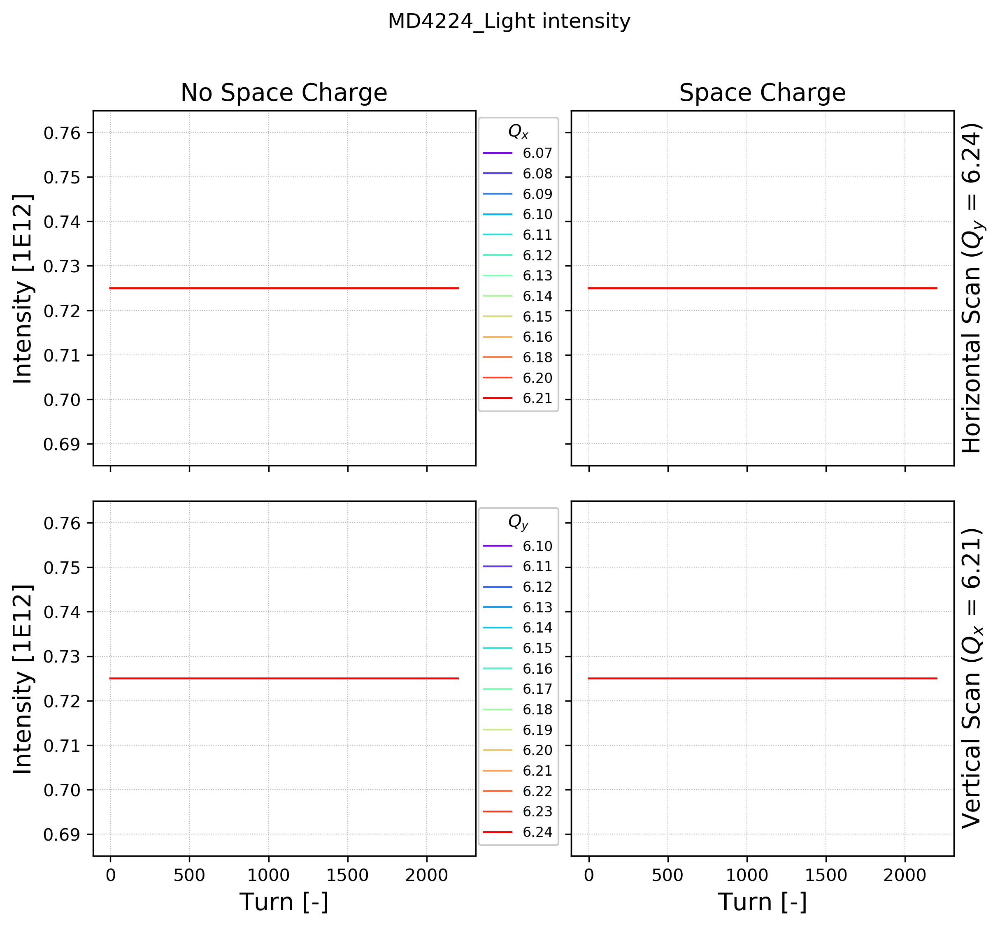

In [10]:
parameter = 'intensity'
multi1 = 1E-12

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Intensity [1E12]');
ax3.set_ylabel('Intensity [1E12]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

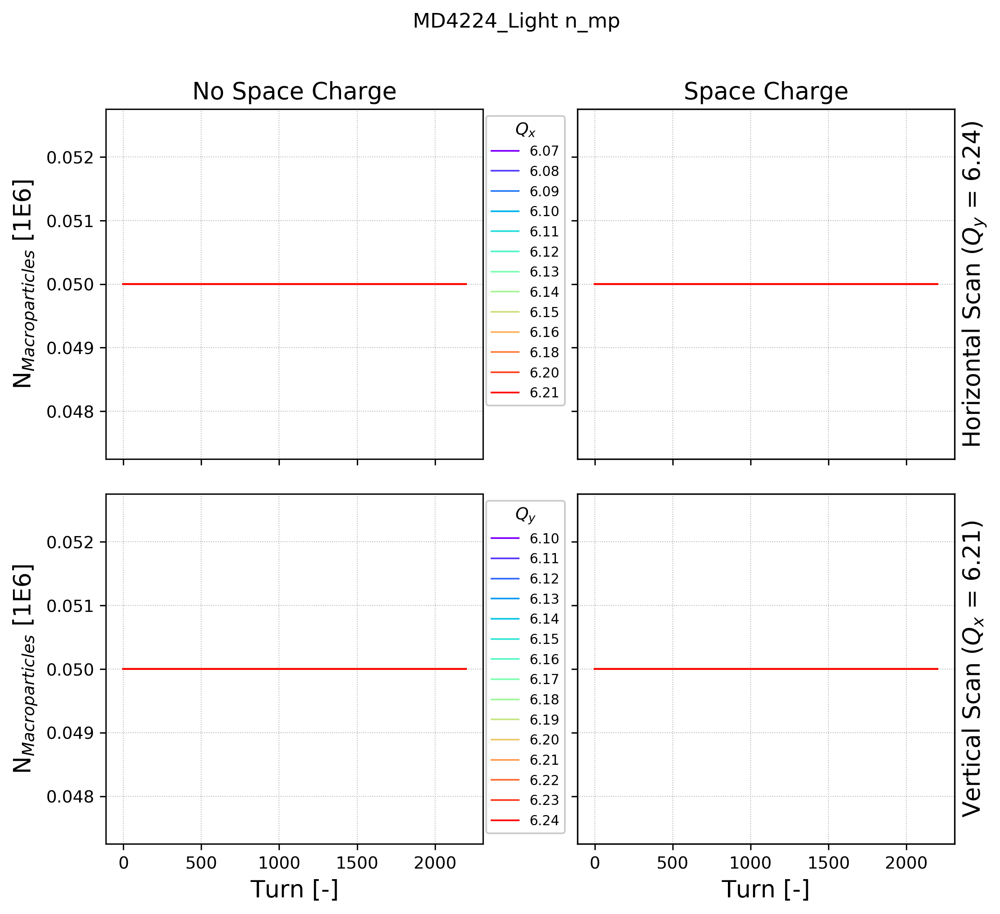

In [11]:
parameter = 'n_mp'
multi1 = 1E-6

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

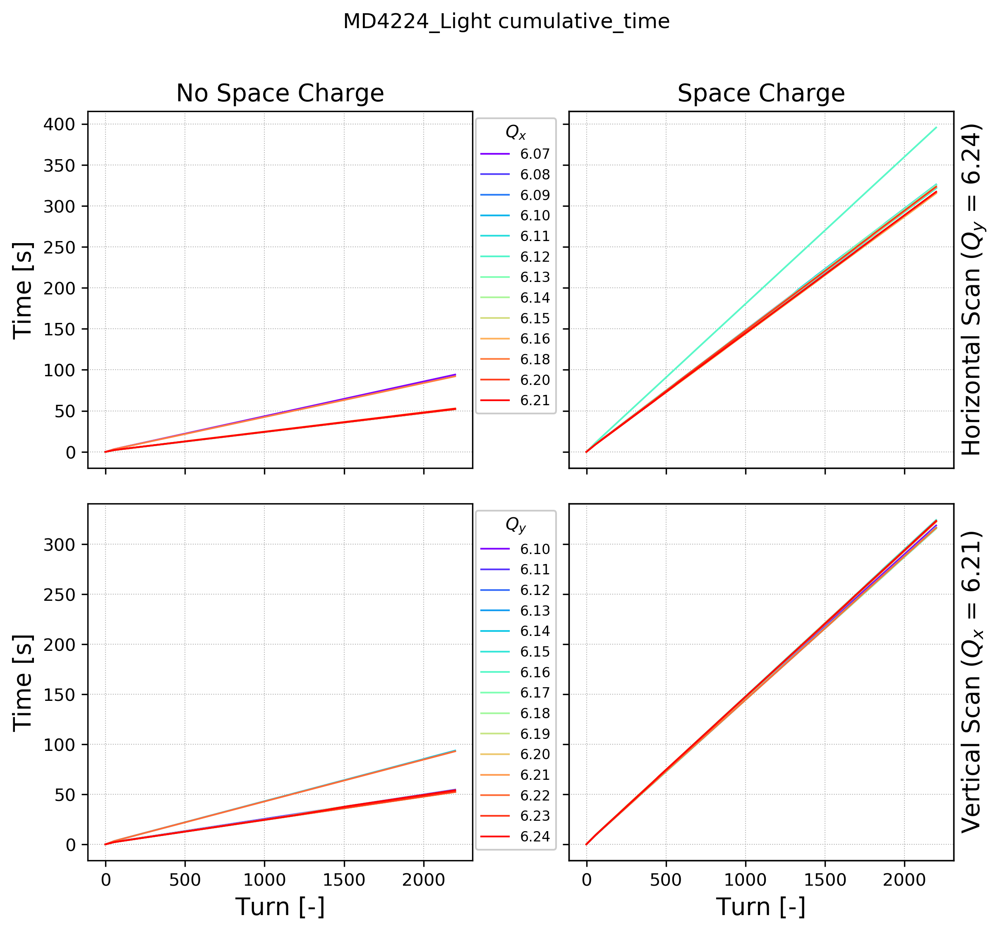

In [12]:
parameter = 'cumulative_time'
multi1 = 1./60.

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time [s]');
ax3.set_ylabel('Time [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax5.set_ylabel(case_label_1);
ax6.set_ylabel(case_label_2);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

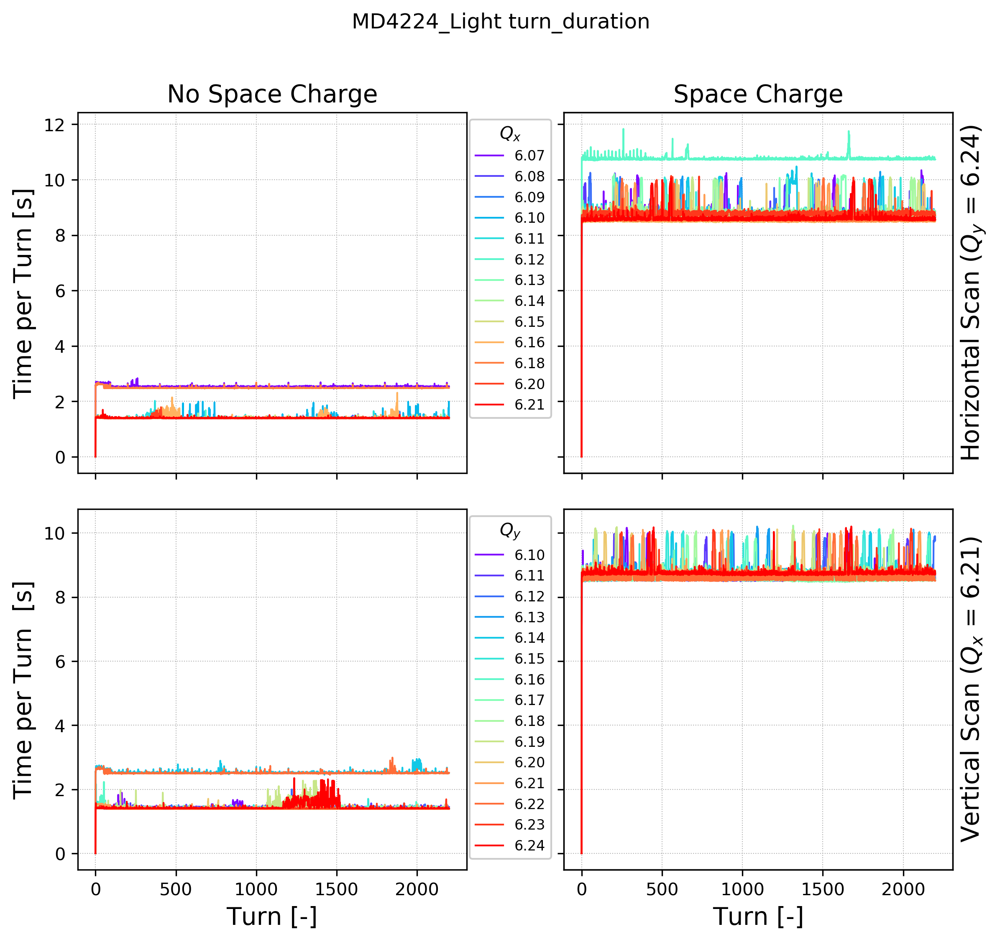

In [13]:
parameter = 'turn_duration'
multi1 = 1

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time per Turn [s]');
ax3.set_ylabel('Time per Turn  [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_x  =  4.37  range =  1.38  =  31.5 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_x  =  4.33  range =  1.1  =  25.4 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_x  =  4.3  range =  0.888  =  20.7 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_x  =  4.27  range =  0.728  =  17.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_x  =  4.25  range =  0.578  =  13.6 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_x  =  4.24  range =  0.47  =  11.1 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_x  =  4.22  range =  0.362  =  8.58 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_x  =  4.21  range =  0.299  =  7.11 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_x  =  4.2  range =  0.243  =  5.79 %
No Space Charge   Horizontal Scan ($Q_y$ = 

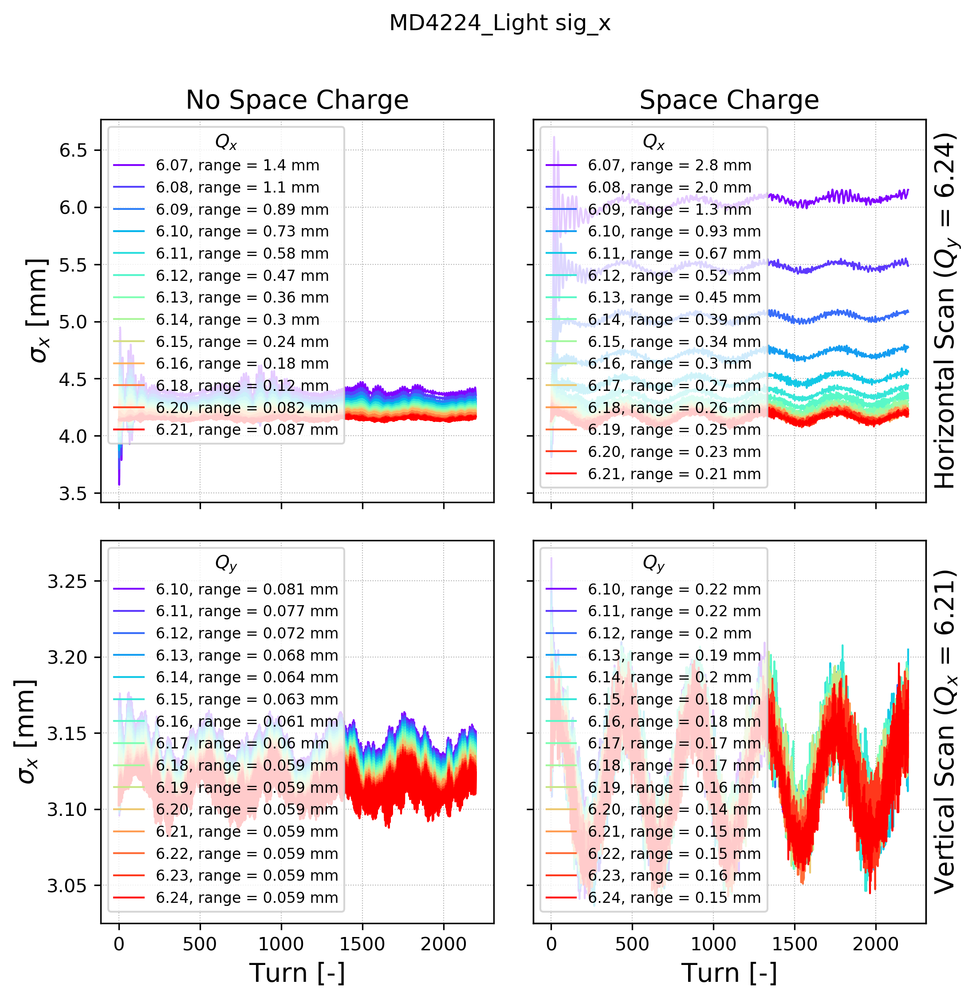

In [14]:
full_labels = True
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_x'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()  

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_xp  =  0.159  range =  0.0349  =  21.9 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_xp  =  0.153  range =  0.0245  =  16.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_xp  =  0.15  range =  0.0172  =  11.5 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_xp  =  0.147  range =  0.0131  =  8.88 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_xp  =  0.145  range =  0.0093  =  6.4 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_xp  =  0.144  range =  0.00711  =  4.94 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_xp  =  0.143  range =  0.00561  =  3.92 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_xp  =  0.142  range =  0.00424  =  2.98 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_xp  =  0.142  range =  0.00306  =  2.16 %
No Space

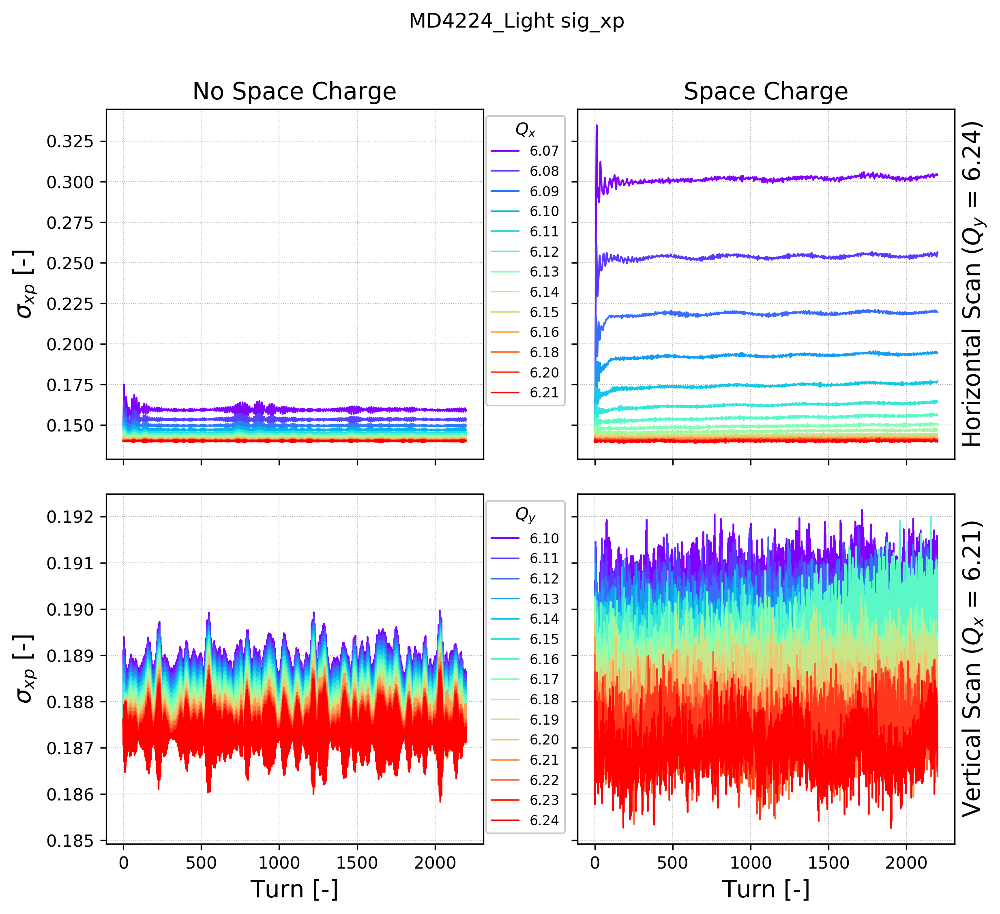

In [15]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_xp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_y  =  2.28  range =  0.028  =  1.23 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_y  =  2.28  range =  0.0277  =  1.22 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_y  =  2.28  range =  0.0277  =  1.22 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_y  =  2.28  range =  0.0276  =  1.21 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_y  =  2.27  range =  0.0275  =  1.21 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_y  =  2.27  range =  0.0274  =  1.2 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_y  =  2.27  range =  0.0273  =  1.2 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_y  =  2.27  range =  0.0272  =  1.2 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_y  =  2.27  range =  0.0272  =  1.2 %
No Space Charge   Horizontal Scan

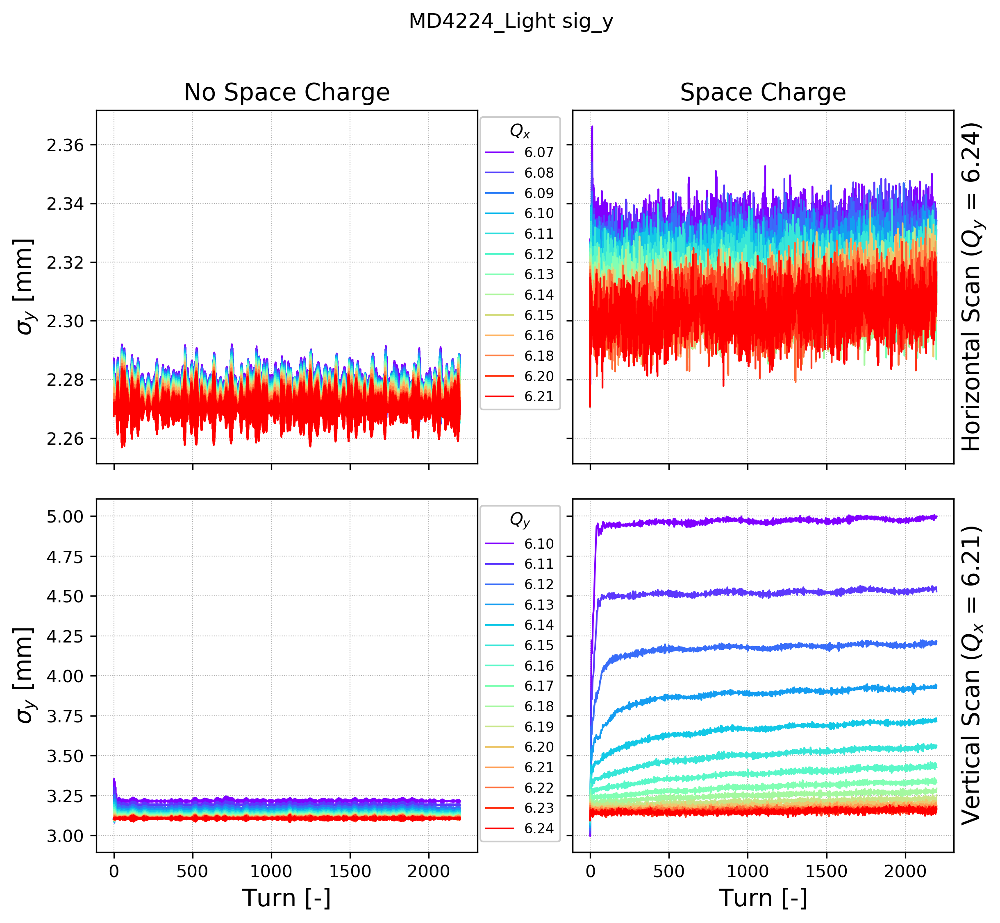

In [16]:
full_labels = False
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_y'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_yp  =  0.193  range =  0.00244  =  1.27 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_yp  =  0.193  range =  0.00243  =  1.26 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_yp  =  0.193  range =  0.00243  =  1.26 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_yp  =  0.193  range =  0.00242  =  1.26 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_yp  =  0.193  range =  0.00242  =  1.25 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_yp  =  0.193  range =  0.00242  =  1.25 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_yp  =  0.193  range =  0.00241  =  1.25 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_yp  =  0.193  range =  0.00241  =  1.25 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_yp  =  0.193  range =  0.00241  =  1.25 %
N

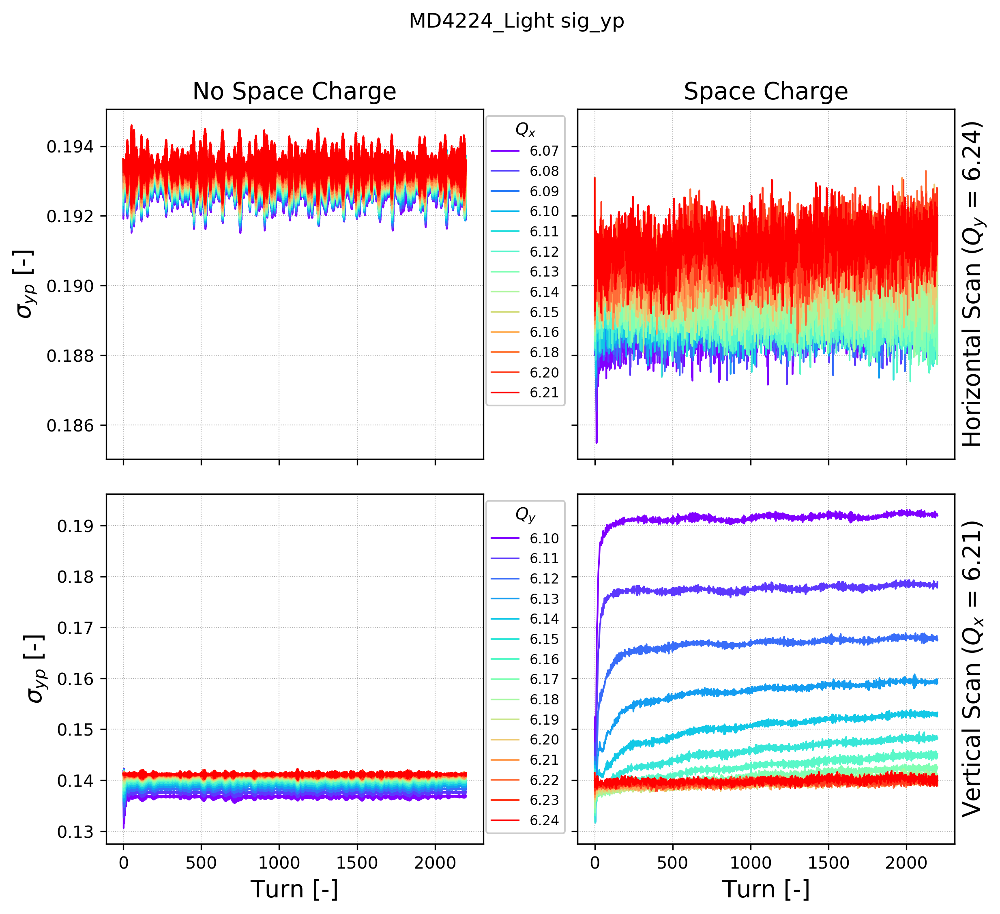

In [17]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_yp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_x  =  19.7  range =  4.61  =  23.3 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  beta_x  =  20.3  range =  3.72  =  18.4 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_x  =  20.7  range =  3.07  =  14.9 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  beta_x  =  21.0  range =  2.34  =  11.2 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_x  =  21.2  range =  1.95  =  9.2 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  beta_x  =  21.5  range =  1.65  =  7.69 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_x  =  21.6  range =  1.34  =  6.17 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  beta_x  =  21.8  range =  1.03  =  4.75 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  beta_x  =  21.9  range =  0.832  =  3.8 %
No Space Charge   Horizontal Scan ($Q_

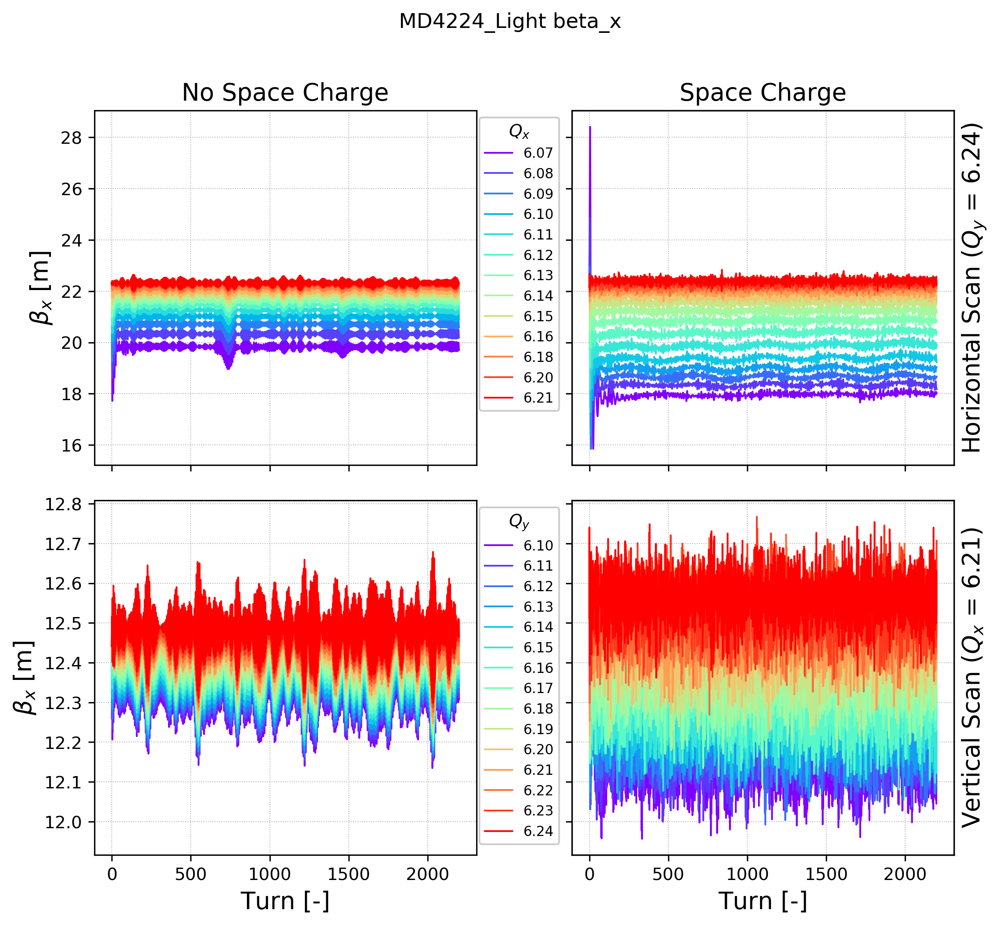

In [18]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_x$ [m]');
ax3.set_ylabel(r'$\beta_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    
ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_y  =  11.8  range =  0.291  =  2.47 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  beta_y  =  11.8  range =  0.288  =  2.44 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_y  =  11.8  range =  0.287  =  2.43 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  beta_y  =  11.8  range =  0.286  =  2.42 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_y  =  11.8  range =  0.285  =  2.42 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  beta_y  =  11.8  range =  0.284  =  2.4 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_y  =  11.8  range =  0.284  =  2.4 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  beta_y  =  11.8  range =  0.283  =  2.39 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  beta_y  =  11.8  range =  0.282  =  2.39 %
No Space Charge   Horizontal S

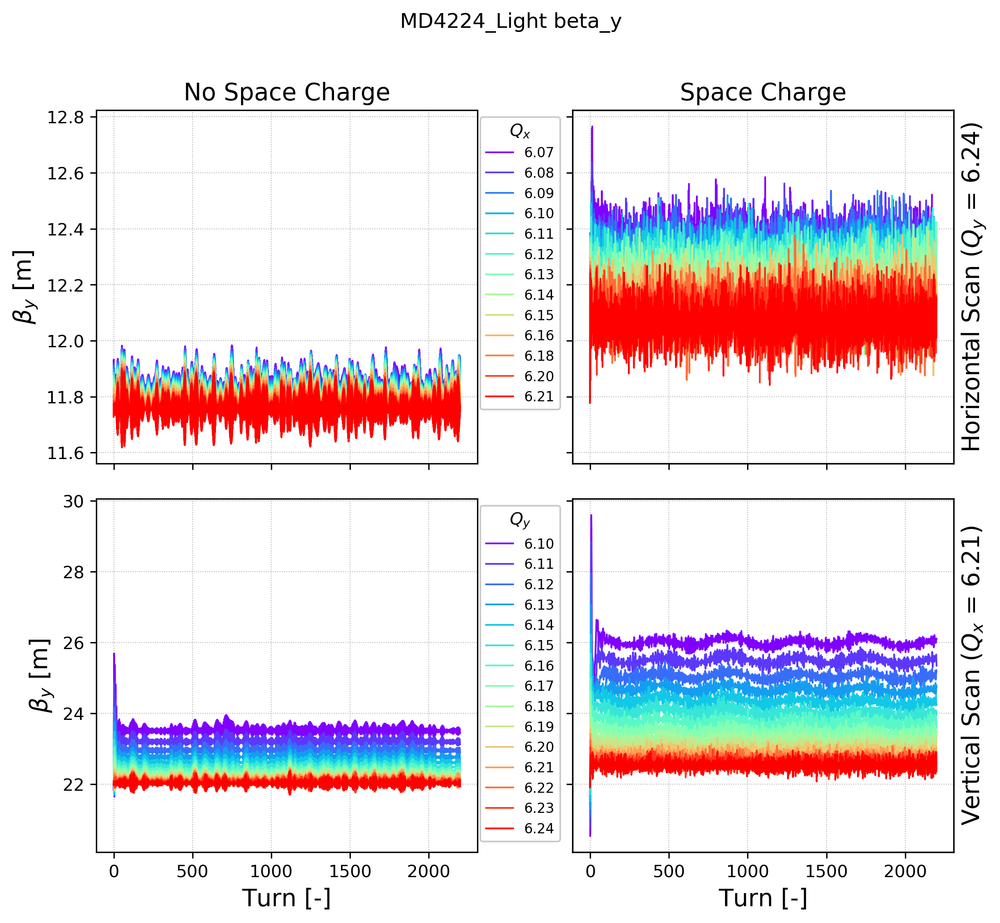

In [19]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_y$ [m]');
ax3.set_ylabel(r'$\beta_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_x  =  3.61  range =  2.08  =  57.8 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  D_x  =  3.54  range =  1.68  =  47.4 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_x  =  3.48  range =  1.37  =  39.3 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  D_x  =  3.43  range =  1.12  =  32.5 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_x  =  3.38  range =  0.917  =  27.1 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  D_x  =  3.34  range =  0.737  =  22.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_x  =  3.31  range =  0.622  =  18.8 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  D_x  =  3.27  range =  0.488  =  14.9 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  D_x  =  3.24  range =  0.392  =  12.1 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.16 Ave

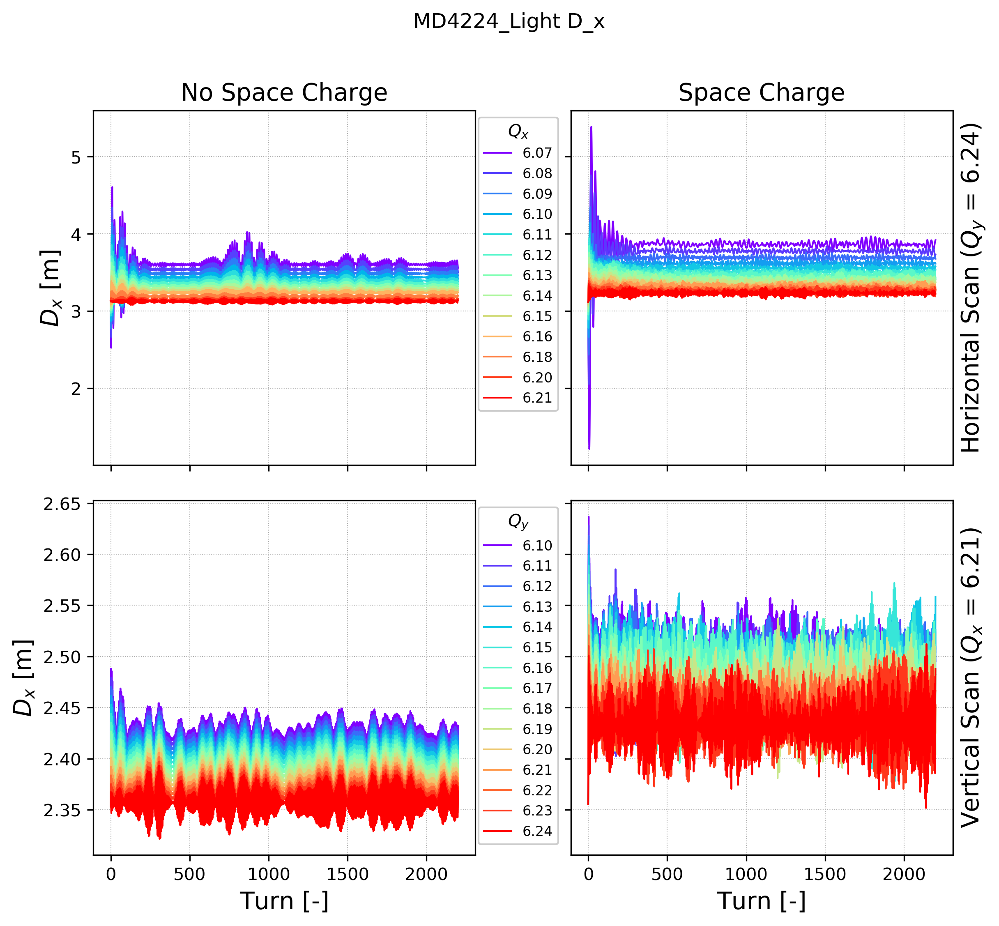

In [20]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_x$ [m]');
ax3.set_ylabel(r'$D_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_y  =  -0.0092  range =  0.0702  =  -763.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  D_y  =  -0.00887  range =  0.0684  =  -772.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_y  =  -0.0084  range =  0.0667  =  -795.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  D_y  =  -0.00787  range =  0.0671  =  -853.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_y  =  -0.00734  range =  0.0675  =  -920.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  D_y  =  -0.00683  range =  0.0677  =  -992.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_y  =  -0.00635  range =  0.0682  =  -1070.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  D_y  =  -0.0059  range =  0.0684  =  -1160.0 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  D_y  =  -0.00549  range =  0.0685  =  -1

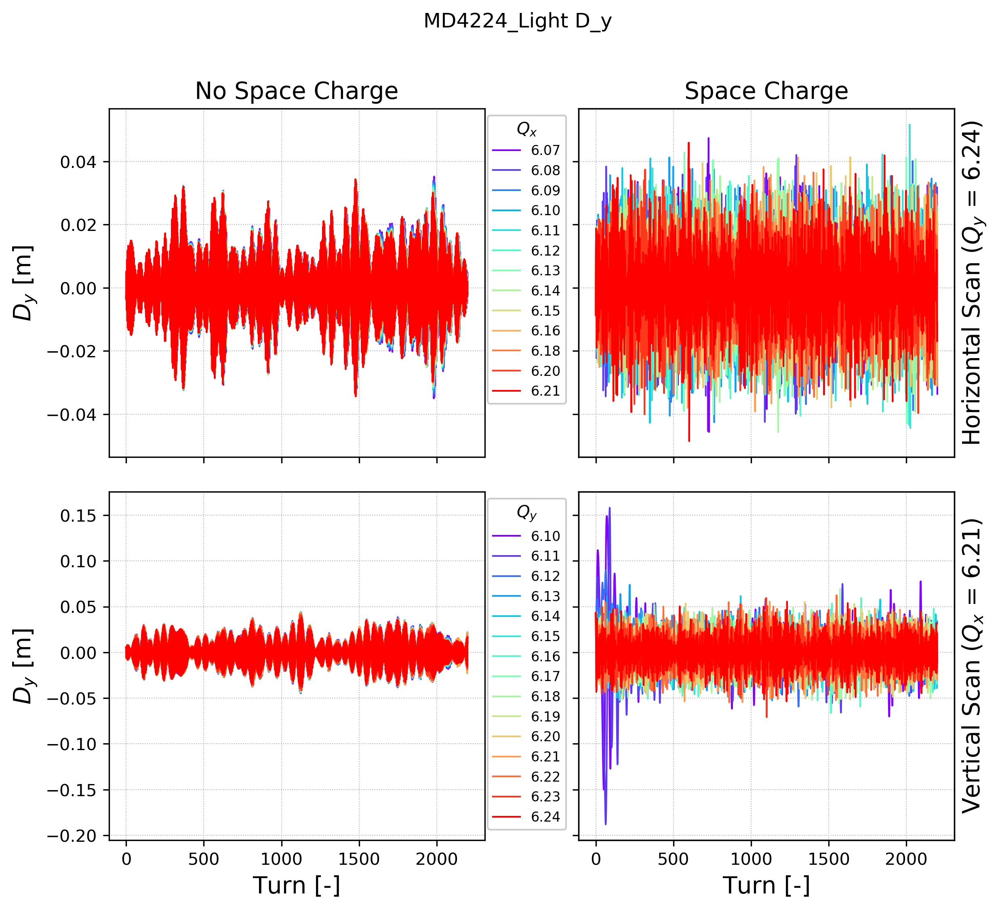

In [21]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_y$ [m]');
ax3.set_ylabel(r'$D_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  dpp_rms  =  0.871  range =  0.0175  =  2.01 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  dpp_rms  =  0.871  range =  0.0172  =  1.98 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  dpp_rms  =  0.871  range =  0.0169  =  1.95 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  dpp_rms  =  0.871  range =  0.0167  =  1.92 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  dpp_rms  =  0.871  range =  0.0164  =  1.89 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  dpp_rms  =  0.871  range =  0.0162  =  1.86 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  dpp_rms  =  0.871  range =  0.0159  =  1.83 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  dpp_rms  =  0.871  range =  0.0157  =  1.8 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  dpp_rms  =  0.871  range =  0.0155  =  1.78 %
No

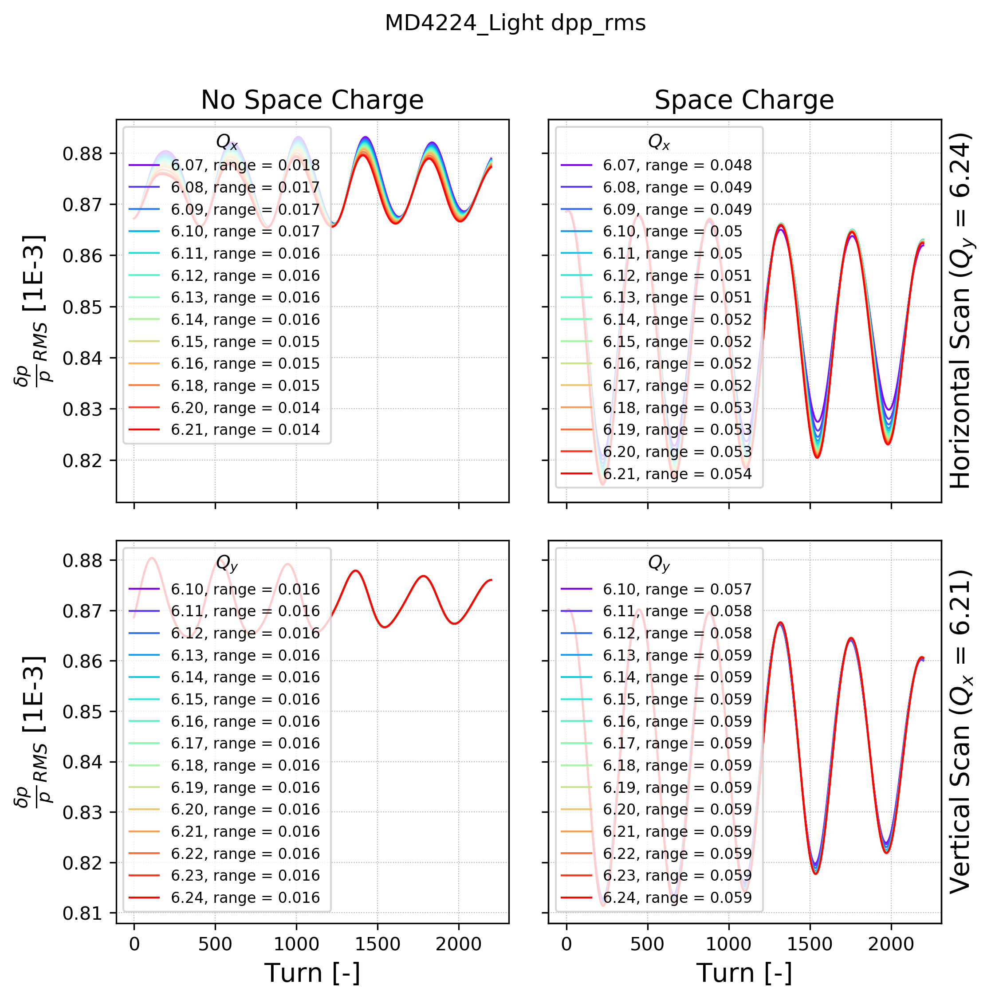

In [22]:
full_labels = True
range_unit = ''
round_sig_limit = 2
parameter = 'dpp_rms'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  bunchlength  =  134.0  range =  2.56  =  1.91 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  bunchlength  =  134.0  range =  2.51  =  1.88 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  bunchlength  =  134.0  range =  2.47  =  1.85 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  bunchlength  =  134.0  range =  2.43  =  1.82 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  bunchlength  =  134.0  range =  2.39  =  1.79 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  bunchlength  =  134.0  range =  2.36  =  1.76 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  bunchlength  =  134.0  range =  2.32  =  1.73 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  bunchlength  =  134.0  range =  2.28  =  1.71 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  bunchlength  =  134.0  range = 

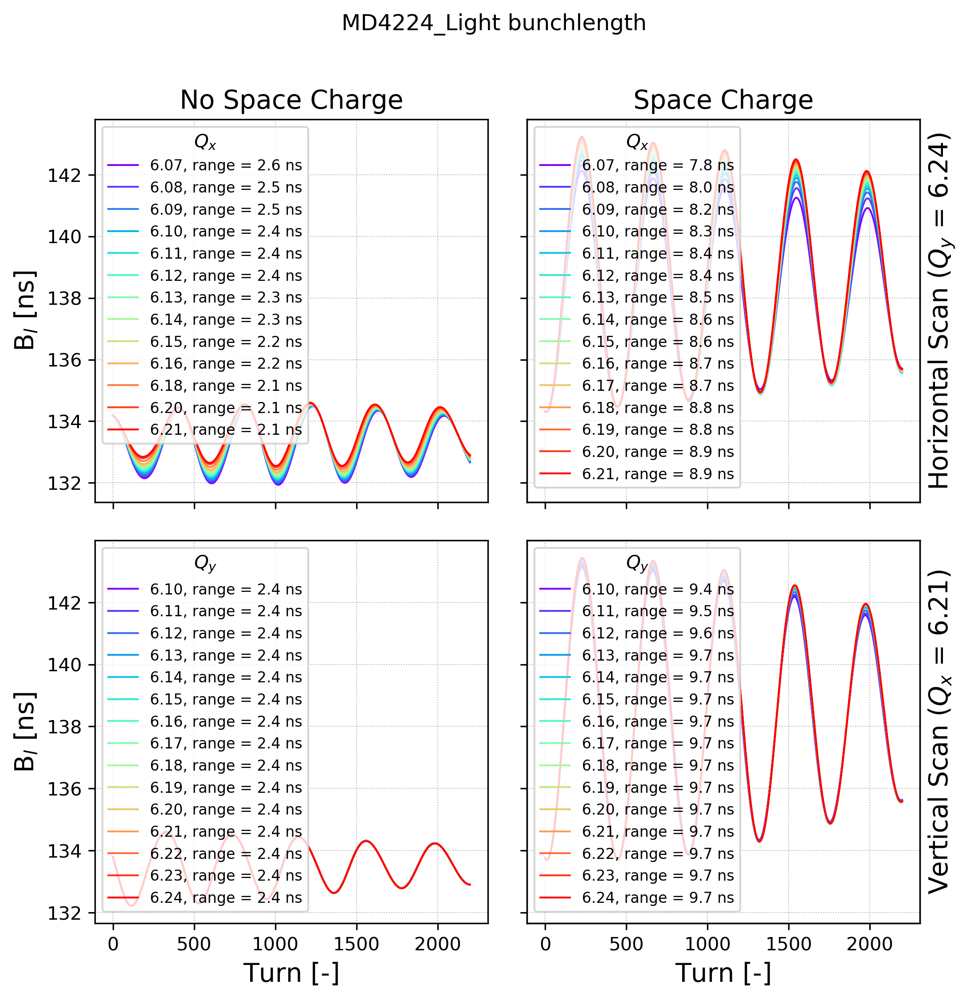

In [23]:
full_labels = True
range_unit = 'ns'
round_sig_limit = 2
parameter = 'bunchlength'
multi1 = 1E9

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'B$_l$ [ns]');
ax3.set_ylabel(r'B$_l$ [ns]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_z  =  9.19  range =  0.176  =  1.91 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_z  =  9.19  range =  0.172  =  1.88 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_z  =  9.19  range =  0.17  =  1.85 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_z  =  9.19  range =  0.167  =  1.82 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_z  =  9.19  range =  0.164  =  1.79 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_z  =  9.19  range =  0.162  =  1.76 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_z  =  9.19  range =  0.159  =  1.73 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_z  =  9.19  range =  0.157  =  1.71 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_z  =  9.19  range =  0.154  =  1.68 %
No Space Charge   Horizontal Scan ($Q_

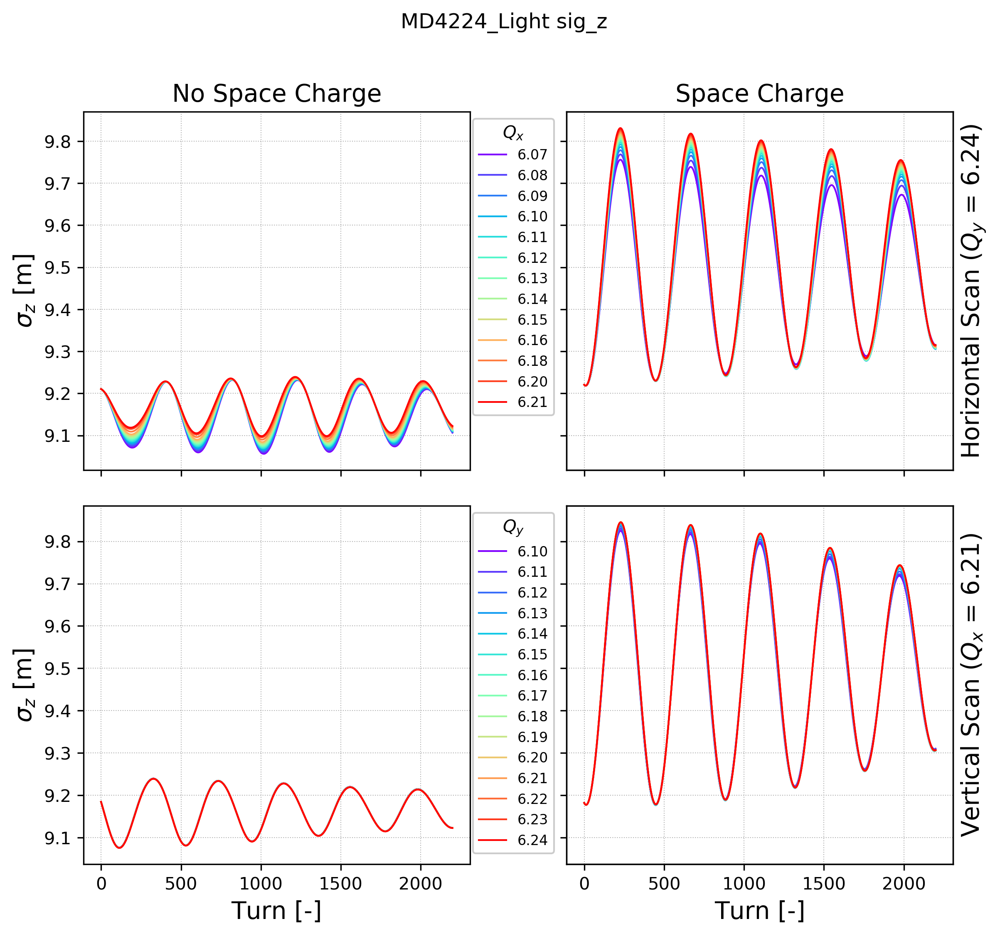

In [24]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_dE  =  1.71  range =  0.0343  =  2.01 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_dE  =  1.71  range =  0.0337  =  1.98 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_dE  =  1.71  range =  0.0332  =  1.95 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_dE  =  1.71  range =  0.0327  =  1.92 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_dE  =  1.71  range =  0.0322  =  1.89 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_dE  =  1.71  range =  0.0317  =  1.86 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_dE  =  1.71  range =  0.0313  =  1.83 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_dE  =  1.71  range =  0.0308  =  1.8 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_dE  =  1.71  range =  0.0303  =  1.78 %
No Space Charge   Ho

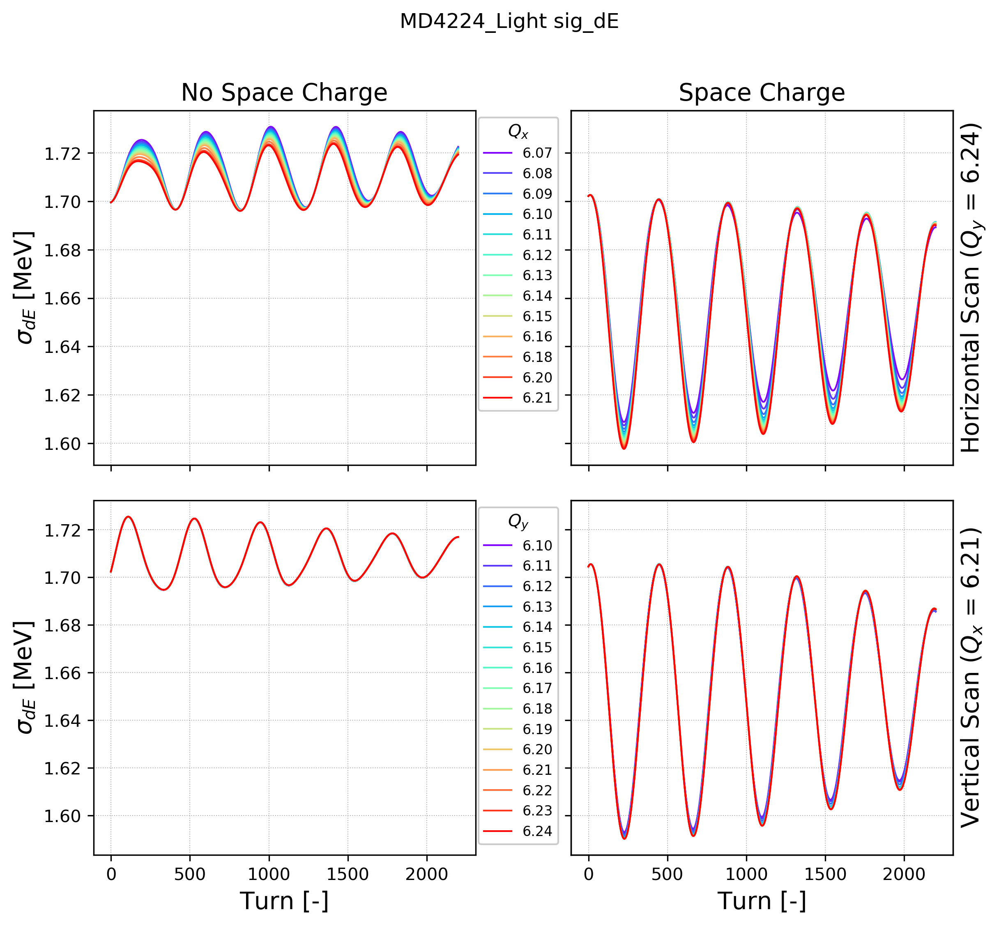

In [25]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_dE'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  eps_z  =  0.718  range =  0.00163  =  0.227 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  eps_z  =  0.718  range =  0.00163  =  0.227 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  eps_z  =  0.718  range =  0.00162  =  0.226 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  eps_z  =  0.718  range =  0.00162  =  0.225 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  eps_z  =  0.718  range =  0.00161  =  0.224 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  eps_z  =  0.718  range =  0.00161  =  0.224 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  eps_z  =  0.718  range =  0.0016  =  0.223 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  eps_z  =  0.718  range =  0.00159  =  0.222 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  eps_z  =  0.718  range =  0.00159  =  0.221 %
No

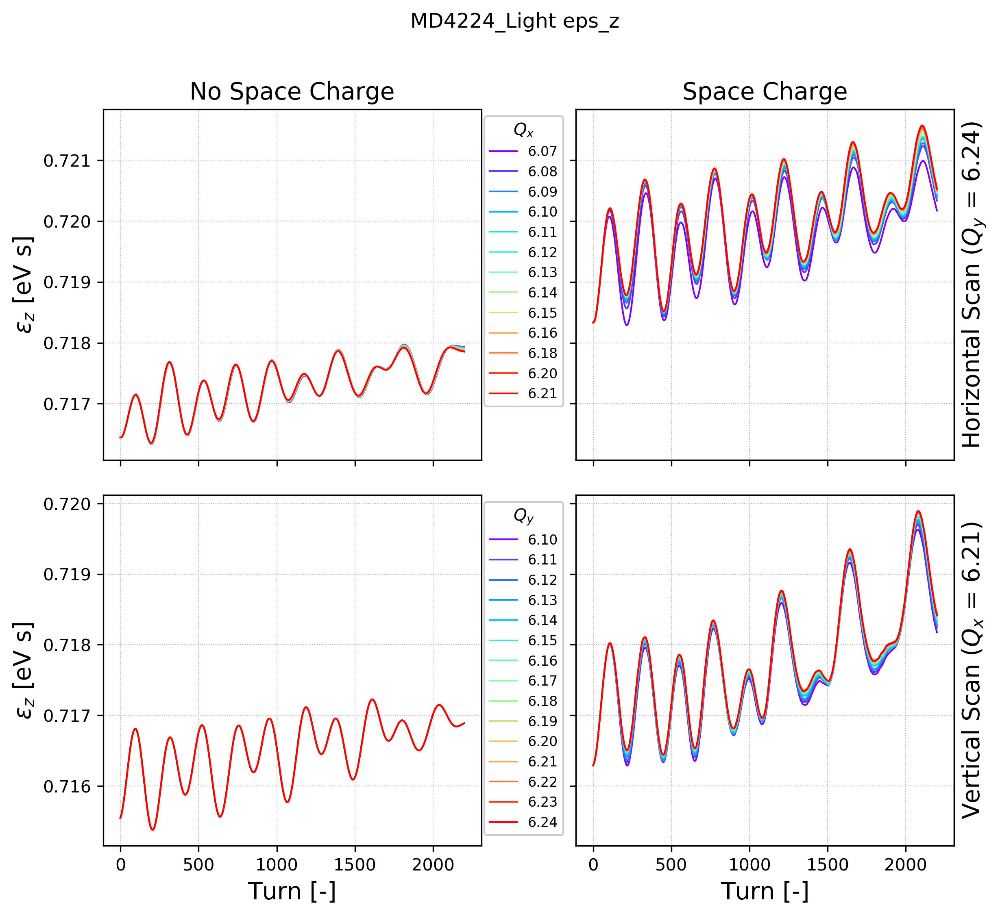

In [26]:
full_labels = False
range_unit = 'eV s'
round_sig_limit = 2
parameter = 'eps_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  1.06  range =  0.065  =  6.12 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_x  =  1.04  range =  0.0405  =  3.9 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  1.02  range =  0.026  =  2.53 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_x  =  1.02  range =  0.0169  =  1.66 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.01  range =  0.0111  =  1.1 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_x  =  1.01  range =  0.0073  =  0.725 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  1.0  range =  0.00482  =  0.48 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_x  =  1.0  range =  0.00315  =  0.314 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_x  =  1.0  range =  0.00202  =  0.202 %
No Space Charge   Ho

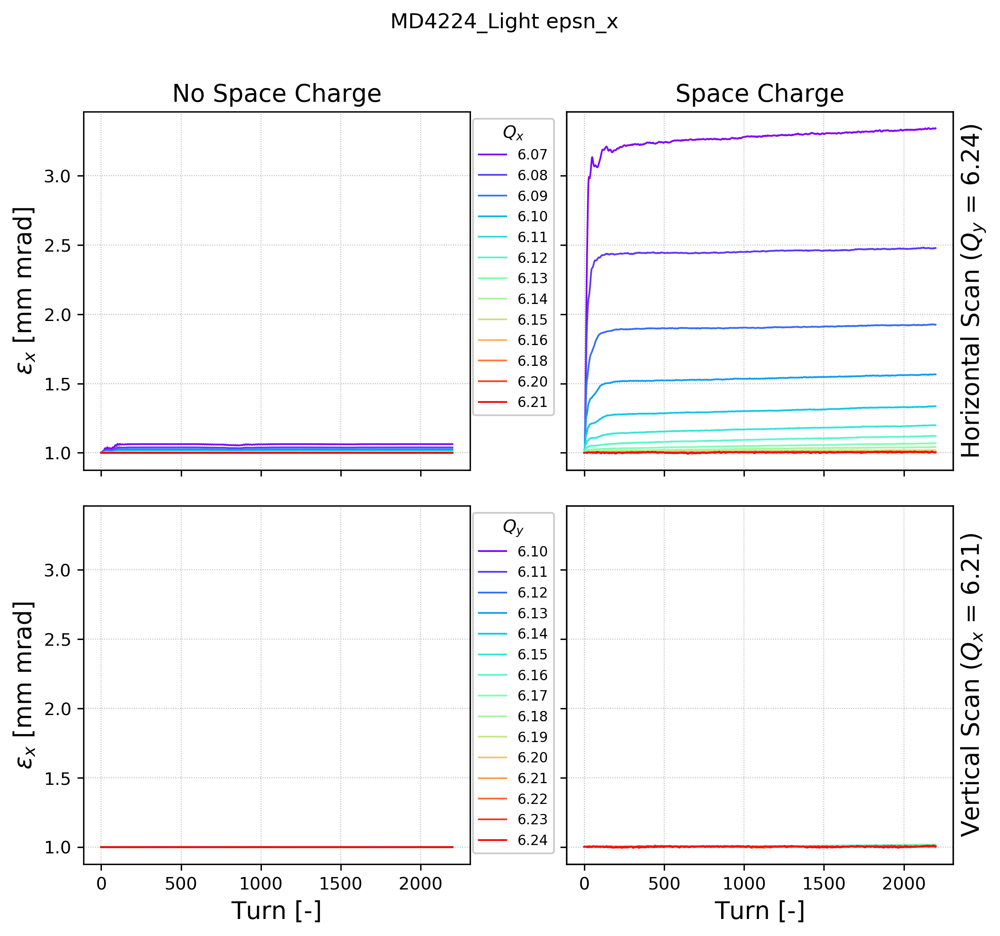

In [27]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_x'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.0  range =  0.000159  =  0.0159 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.0  range =  0.000161  =  0.0161 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.0  range =  0.000161  =  0.0161 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  1.0  range =  0.000161  =  0.0161 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.0  range =  0.000162  =  0.0162 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.0  range =  0.000165  =  0.0165 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.0  range =  0.000164  =  0.0164 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  1.0  range =  0.000164  =  0.0164 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.0  range =  0.000162  =  0

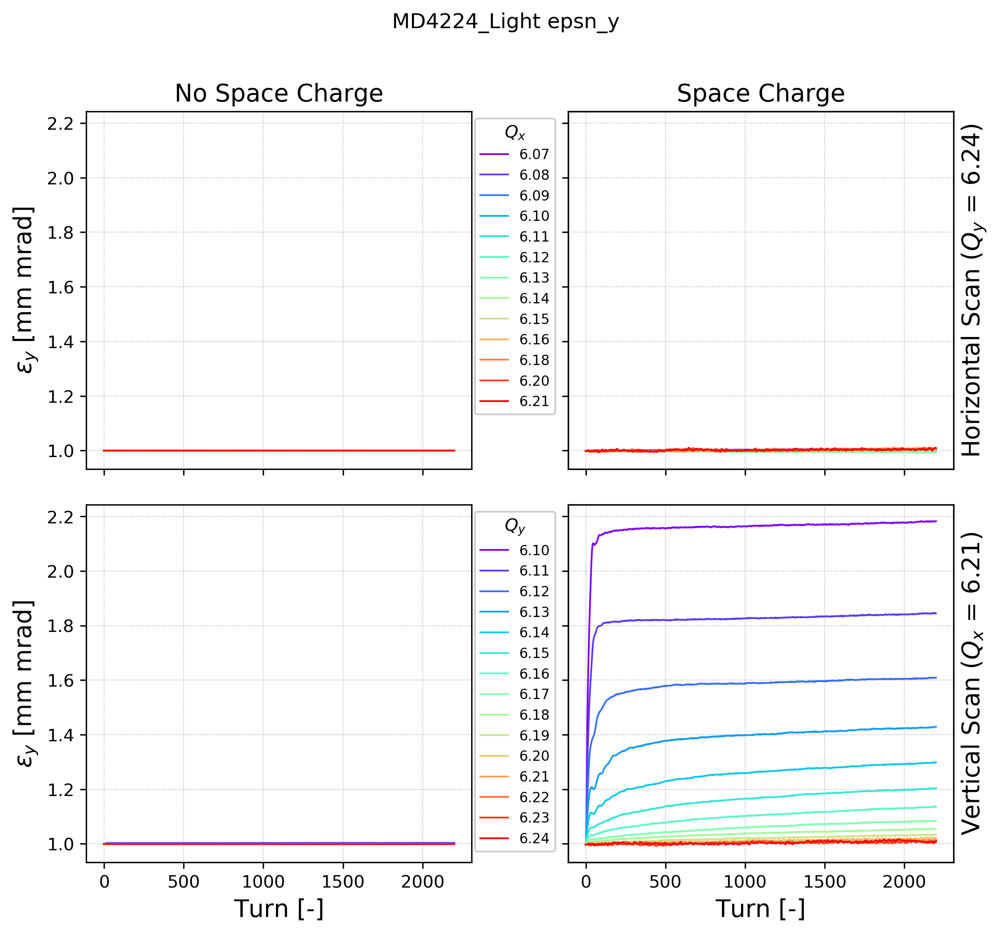

In [28]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_y'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.03  range =  0.0325  =  3.15 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.02  range =  0.0203  =  1.99 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.01  range =  0.013  =  1.29 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  1.01  range =  0.00845  =  0.839 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.01  range =  0.00555  =  0.553 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.0  range =  0.00365  =  0.364 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.0  range =  0.00241  =  0.24 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  1.0  range =  0.00157  =  0.157 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.0  range =  0.00101  =  0.101 %
No Space Char

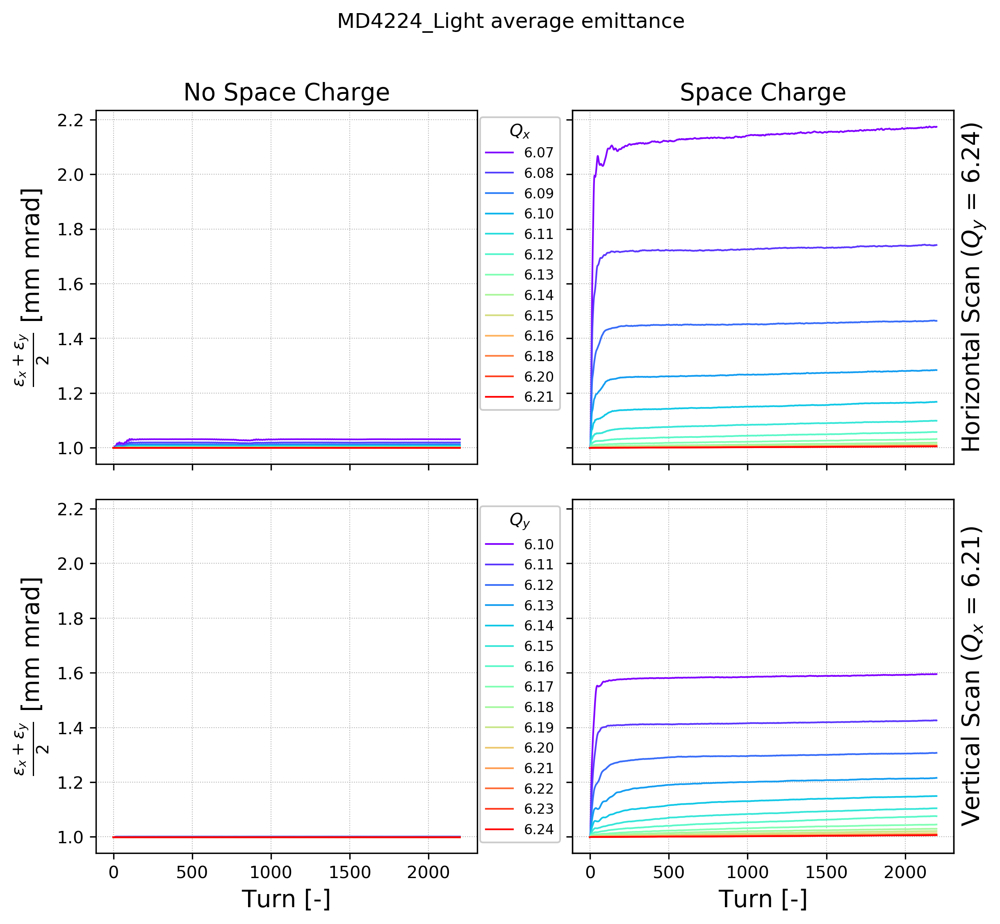

In [29]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2

parameter1 = 'epsn_x'
multi1 = 1E6
parameter2 = 'epsn_y'
multi2 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' average emittance'

fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    x = np.array(dd1[key]['turn'][0])
    y = np.array((dd1[key][parameter1][0]*multi1 + dd1[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
      

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    x = np.array(dd2[key]['turn'][0])
    y = np.array((dd2[key][parameter1][0]*multi1 + dd2[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
 
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    x = np.array(dd3[key]['turn'][0])
    y = np.array((dd3[key][parameter1][0]*multi1 + dd3[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    x = np.array(dd4[key]['turn'][0])
    y = np.array((dd4[key][parameter1][0]*multi1 + dd4[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_average_emittance.png'
plt.savefig(savename); 

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  1.06  range =  0.065  =  6.12 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_x  =  1.04  range =  0.0405  =  3.9 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  1.02  range =  0.026  =  2.53 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_x  =  1.02  range =  0.0169  =  1.66 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.01  range =  0.0111  =  1.1 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_x  =  1.01  range =  0.0073  =  0.725 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  1.0  range =  0.00482  =  0.48 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_x  =  1.0  range =  0.00315  =  0.314 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_x  =  1.0  range =  0.00202  =  0.202 %
No Space Charge   Ho

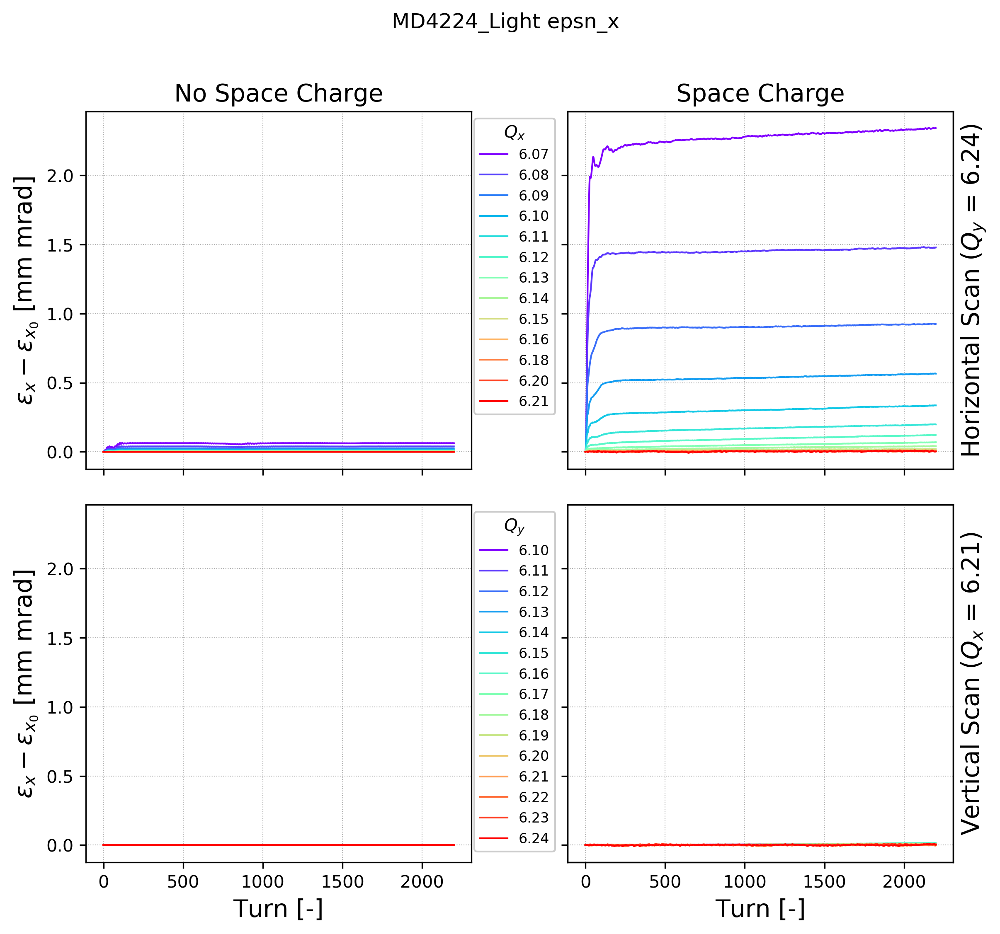

In [30]:
parameter = 'epsn_x'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);

No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.0  range =  0.000159  =  0.0159 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.0  range =  0.000161  =  0.0161 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.0  range =  0.000161  =  0.0161 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  1.0  range =  0.000161  =  0.0161 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.0  range =  0.000162  =  0.0162 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.0  range =  0.000165  =  0.0165 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.0  range =  0.000164  =  0.0164 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  1.0  range =  0.000164  =  0.0164 %
No Space Charge   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.0  range =  0.000162  =  0

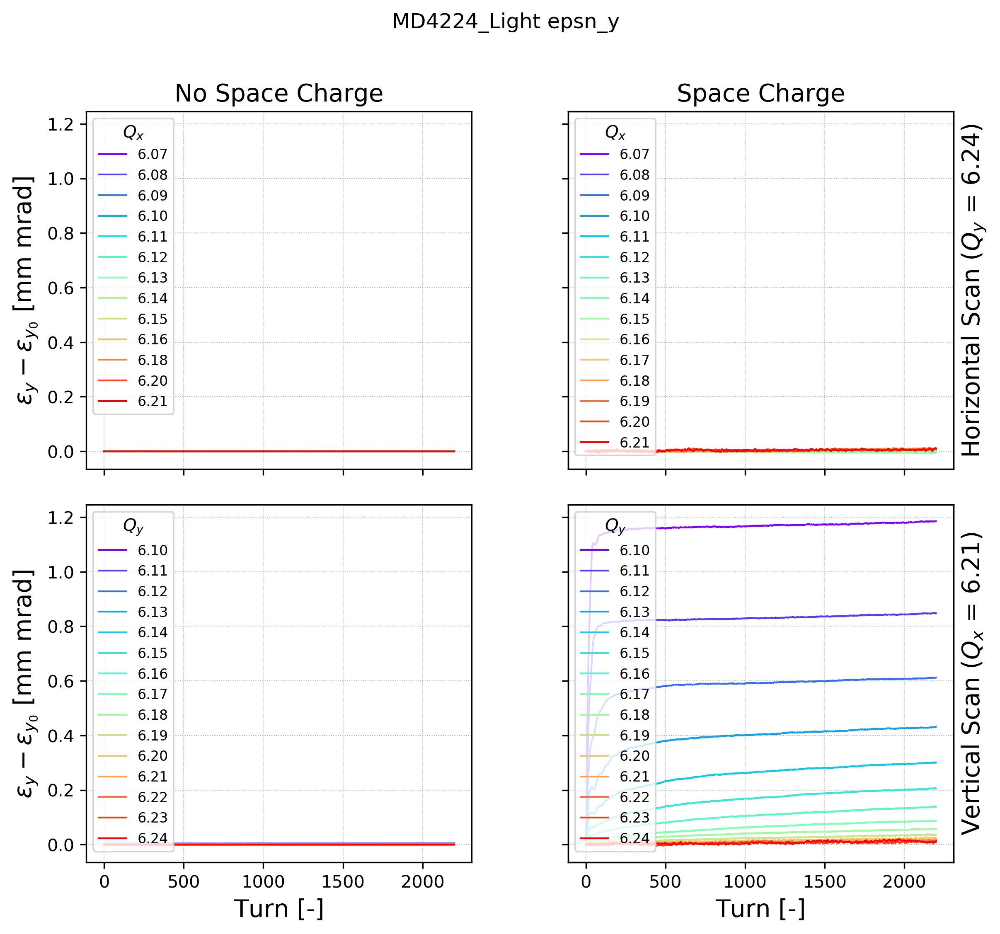

In [31]:
full_labels = True
range_unit = 'mm mrad'
round_sig_limit = 2

parameter = 'epsn_y'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);